## Configuración inicial

A continuación se importan las librerías necesarias para el funcionamiento del notebook.

In [2]:
#plots and data
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#metrics and transformations
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn import metrics

#Model 
from sklearn.neural_network import ELMRegressor
sns.set()

In [14]:
def plot_predict_test(df_test_y,testPredict,lag):
        ### Resultado predicción datos de entrenamiento
    print(testPredict.flatten())
    fig, ax = plt.subplots(figsize=[15,8])
    sns.lineplot(df_test_y.flatten(),label="real")
    sns.lineplot(testPredict.flatten(),label="predicción")
    plt.title("Comparación valor real y predicción")
    plt.ylabel("value")

In [15]:
def createLagFeature(name_features,lag,df):
    for name_feature in name_features:
        for i in range(1,lag+1):
            df[name_feature+"lag"+str(i)]=df[name_feature].shift(i)
    return df

In [16]:
#function to measure the performance
def timeseries_evaluation_metrics_func(y_true, y_pred,flag):
    def mean_absolute_percentage_error(y_true, y_pred): 
        epsilon=0.1e-5
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    if flag : print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')
    else:
        print('Evaluation metric results:')
        print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
        print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
        print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
        print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
        
    return {"MSE":metrics.mean_squared_error(y_true, y_pred),
           "MAE":metrics.mean_absolute_error(y_true, y_pred),
           "RMSE":np.sqrt(metrics.mean_squared_error(y_true, y_pred)),
           "MAPE":mean_absolute_percentage_error(y_true, y_pred)}

---

## Cargar y preparar los datos.

In [3]:
df = pd.read_csv("../../Datasets/Datos_antes_pandemia/data_antes_vol_ve_in.csv")

df['Fecha'] = pd.to_datetime(df['Fecha'])
df = df.sort_values('Fecha', ascending=True)
df = df.rename(columns = {'Vol. Futuros': 'VolFuturos'})
df

,Fecha,VolFuturos,TRM,Precio Interno,VIX,EMV-ID,EPU
0,2010-01-01,0.000000,2044.23,695125.0,22.543626,2.01,174.55
1,2010-01-02,4.256365,2044.23,695125.0,22.171185,0.00,119.52
2,2010-01-03,0.794545,2044.23,695125.0,21.143152,1.15,216.95
3,2010-01-04,0.787899,2044.23,705000.0,20.040000,1.22,150.35
4,2010-01-05,0.601027,2021.21,690000.0,19.350000,0.95,151.16
...,...,...,...,...,...,...,...
3648,2019-12-27,4.003614,3281.40,995000.0,13.430000,0.00,127.92
3649,2019-12-28,2.090121,3294.05,995000.0,14.351756,0.00,123.10
3650,2019-12-29,0.539108,3294.05,995000.0,14.946538,4.26,245.14
3651,2019-12-30,1.815513,3294.05,991000.0,14.820000,0.97,101.31


---

## Desarrollo del modelo ELM

In [18]:
#objects to scale the data 
sc=StandardScaler()
sc2=StandardScaler()

In [19]:
df_stats=df

In [20]:
#
len_data=df_stats.shape[0]

#get target
df_label=df_stats["VolFuturos"].values.reshape(len_data,1)
#get attributes
df_data=df_stats.drop(columns=["Fecha"])

#apply scale
#df_label=sc.fit_transform(df_label)
#df_data_normalize=sc2.fit_transform(df_data)


In [21]:
def Model(df_data,df_label,lag,estimators):
    
    delete_columns=list(df_data.columns)
    df_data_lags=createLagFeature(df_data.columns,lag,df_data) if lag>0 else df_data
    
    df_data_lags.drop(columns=delete_columns,inplace=True)
    df_data_lags=df_data_lags[lag:]
    df_label=df_label[lag:]

    #transform data
    df_data_lags=sc2.fit_transform(df_data_lags)
    
    #split data
    #last index of the train data
    seventy_percent=int(len_data*0.7)

    #split the data normalize
    
    df_train=df_data_lags[:seventy_percent]
    df_test=df_data_lags[seventy_percent:]

    #split labels
    
    df_train_y=df_label[:seventy_percent]
    df_test_y=df_label[seventy_percent:]
    #split labels normalize
    
    df_label_normalize=sc.fit_transform(df_label)
    df_train_y_normalize=df_label_normalize[:seventy_percent]
    df_test_y_normalize=df_label_normalize[seventy_percent:]
    


    #make model
    model=ELMRegressor(hidden_layer_sizes=(estimators,), activation='logistic', solver='adam')
    #fit the model with the train data
    history=model.fit(df_train,df_train_y_normalize)
   
    # make predictions
    trainPredict = model.predict(df_train)
    trainPredict = np.reshape(trainPredict,(len(trainPredict),1))
    # invert transformation
    trainPredict = sc.inverse_transform(trainPredict)
    
    trainY = df_train_y
    
    # make predictions
    testPredict = model.predict(df_test)
    # invert transformation
    testPredict = np.reshape(testPredict,(len(testPredict),1))
    testPredict = sc.inverse_transform(testPredict)
    testY = df_test_y
    print("len test: ",testY.shape)
    print("len PREDICT: ",testPredict.shape)

    plot_predict_test(df_train_y,trainPredict,lag)
    plot_predict_test(df_test_y,testPredict,lag)
    
    return {"train":timeseries_evaluation_metrics_func(trainY.flatten()+1, trainPredict.flatten()+1,False),
           "test":timeseries_evaluation_metrics_func(testY.flatten()+1, testPredict.flatten()+1,False)}

## Resultados

/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.20873716 1.2089534  1.26391655 ... 0.84284333 0.96827779 1.03147603]
[1.43284596 1.70838951 1.26844259 ... 1.5816336  0.74292202 1.64581204]
Evaluation metric results:
MSE is : 1.319886475863852
MAE is : 0.833497513514411
RMSE is : 1.1488631232065254
MAPE is : 40.94830602292143
Evaluation metric results:
MSE is : 0.9570601064383935
MAE is : 0.7373482030588586
RMSE is : 0.978294488606776
MAPE is : 39.22894525802311


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.12538654 1.15432155 1.29005693 ... 0.80422531 0.94607542 1.00659253]
[1.40935309 1.79526065 1.30208425 ... 1.7466766  0.65511109 1.496898  ]
Evaluation metric results:
MSE is : 1.2980775252143886
MAE is : 0.8303461127119743
RMSE is : 1.1393320522193644
MAPE is : 40.94375182823472
Evaluation metric results:
MSE is : 0.9670871132957992
MAE is : 0.7454305657434578
RMSE is : 0.983405874141394
MAPE is : 39.84255154077319


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.14204158 1.19055746 1.22648588 ... 0.8246992  0.9690536  1.01045935]
[1.39217366 1.68266809 1.23402694 ... 1.55791419 0.72970197 1.61200884]
Evaluation metric results:
MSE is : 1.3181777586904315
MAE is : 0.8289648173738635
RMSE is : 1.1481192266879043
MAPE is : 40.32622534453258
Evaluation metric results:
MSE is : 0.9551052076674832
MAE is : 0.7326779257664726
RMSE is : 0.9772948417276555
MAPE is : 38.68976477485791


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.17629164 1.20083538 1.22041724 ... 0.89331817 0.98937223 1.02640158]
[1.44857968 1.72584065 1.28435055 ... 1.60227412 0.7920771  1.63666681]
Evaluation metric results:
MSE is : 1.3202809653195609
MAE is : 0.8398416332921245
RMSE is : 1.1490347972622765
MAPE is : 41.6757903615519
Evaluation metric results:
MSE is : 0.958327459941758
MAE is : 0.7455444275796874
RMSE is : 0.9789420105102028
MAPE is : 40.28252243352408


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.16414921 1.20507334 1.22253014 ... 0.85904358 0.97205928 1.02017952]
[1.43097007 1.69605641 1.25503072 ... 1.55199041 0.75138012 1.60047376]
Evaluation metric results:
MSE is : 1.3191917465984795
MAE is : 0.8344790329227495
RMSE is : 1.1485607283023738
MAPE is : 40.998790045559375
Evaluation metric results:
MSE is : 0.954510755118124
MAE is : 0.7374709784945079
RMSE is : 0.9769906627589252
MAPE is : 39.310263619314554


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.12552795 1.17782944 1.19000686 ... 0.85000513 0.96471389 0.99443265]
[1.40860554 1.67718384 1.23422806 ... 1.53291413 0.75118152 1.61379348]
Evaluation metric results:
MSE is : 1.321440685329495
MAE is : 0.8296396370605578
RMSE is : 1.149539336138392
MAPE is : 40.339226320624086
Evaluation metric results:
MSE is : 0.9512257042602095
MAE is : 0.7327121221902548
RMSE is : 0.9753080048170473
MAPE is : 38.801942154845534


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.1538214  1.19491263 1.21326075 ... 0.87964013 0.97942919 1.02193673]
[1.43722655 1.70923643 1.2681168  ... 1.56193926 0.77090875 1.59931405]
Evaluation metric results:
MSE is : 1.321436090166028
MAE is : 0.8361071086251665
RMSE is : 1.149537337438862
MAPE is : 41.15787596844277
Evaluation metric results:
MSE is : 0.9542163215081085
MAE is : 0.7402079892483325
RMSE is : 0.9768399671942731
MAPE is : 39.678265449146615


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.15851537 1.22606396 1.21888779 ... 0.90349887 0.99679463 1.02497629]
[1.45092257 1.71741292 1.28105861 ... 1.587669   0.81284696 1.61795249]
Evaluation metric results:
MSE is : 1.3213537936714226
MAE is : 0.8397136792365938
RMSE is : 1.1495015413958445
MAPE is : 41.62107672584895
Evaluation metric results:
MSE is : 0.9547750444835494
MAE is : 0.7420656591905469
RMSE is : 0.9771259102508486
MAPE is : 39.92386585825931


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.19564418 1.26071277 1.26667504 ... 0.90429648 1.01951851 1.04105774]
[1.45099964 1.71644155 1.27352419 ... 1.56304562 0.793931   1.65495852]
Evaluation metric results:
MSE is : 1.3217394844804633
MAE is : 0.8453403236143414
RMSE is : 1.1496692935276924
MAPE is : 42.29378642002376
Evaluation metric results:
MSE is : 0.9574895949568073
MAE is : 0.7454488354210194
RMSE is : 0.9785139727958959
MAPE is : 40.29774806462708


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.05151666 1.09384864 1.11532279 ... 0.79897154 0.88405911 0.92518541]
[1.35499487 1.60219891 1.15292162 ... 1.44077122 0.66575843 1.4839923 ]
Evaluation metric results:
MSE is : 1.3327377358935473
MAE is : 0.8182796216289244
RMSE is : 1.1544426083151762
MAPE is : 38.554794446510456
Evaluation metric results:
MSE is : 0.9491458822942807
MAE is : 0.7183636527747299
RMSE is : 0.9742411828157752
MAPE is : 36.88035302745247


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.20424023 1.25817714 1.25428355 ... 0.95213618 1.02117156 1.04556895]


<ipython-input-14-72e029a2b199>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=[15,8])


[1.48557892 1.74691674 1.31146946 ... 1.59936545 0.82941265 1.617753  ]
Evaluation metric results:
MSE is : 1.3260147773272788
MAE is : 0.8517120363779295
RMSE is : 1.1515271500608566
MAPE is : 43.0060634008284
Evaluation metric results:
MSE is : 0.9609340577085417
MAE is : 0.7527484290802043
RMSE is : 0.9802724405534115
MAPE is : 41.15561307908515


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.1551661  1.22326144 1.22609294 ... 0.92572199 1.01165151 1.04027021]
[1.46955868 1.72069987 1.27425569 ... 1.54859901 0.76921807 1.58236216]
Evaluation metric results:
MSE is : 1.3244265829366528
MAE is : 0.8448411567967167
RMSE is : 1.1508373399124017
MAPE is : 42.1506129168753
Evaluation metric results:
MSE is : 0.9552389137028542
MAE is : 0.7454431246889777
RMSE is : 0.9773632455248428
MAPE is : 40.347876312972936


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1093, 1)
len PREDICT:  (1093, 1)
[1.04844154 1.1663614  1.12121782 ... 0.86434551 0.93824065 0.95038293]
[1.38625663 1.63238465 1.20115039 ... 1.48578126 0.77350188 1.51039025]
Evaluation metric results:
MSE is : 1.3280918601305591
MAE is : 0.824402546616279
RMSE is : 1.1524286789778182
MAPE is : 39.46281554790443
Evaluation metric results:
MSE is : 0.9457596403316176
MAE is : 0.7237249153613343
RMSE is : 0.9725017430995266
MAPE is : 37.75722881434778


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.27927049 1.39872153 0.96957788 ... 0.98935804 1.47576858 1.84224402]
[1.14738122 1.02996447 1.10305488 ... 1.75120016 0.81532436 1.68687742]
Evaluation metric results:
MSE is : 1.2829360380566552
MAE is : 0.8266862962728655
RMSE is : 1.1326676644350078
MAPE is : 40.79583343592779
Evaluation metric results:
MSE is : 0.9787999553757504
MAE is : 0.7461625619137837
RMSE is : 0.9893431939300691
MAPE is : 39.675304455742676


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.43113637 1.53363424 1.12336163 ... 1.11573553 1.67043539 1.91955884]
[1.26589981 1.17544729 1.11075289 ... 1.71973049 0.92134337 1.69759147]
Evaluation metric results:
MSE is : 1.2460530008163058
MAE is : 0.8134340094215935
RMSE is : 1.1162674414387914
MAPE is : 40.005192886035076
Evaluation metric results:
MSE is : 0.9927707473974285
MAE is : 0.7572927625704228
RMSE is : 0.9963788172163379
MAPE is : 40.654237048008135


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.30402739 1.33142812 0.9490471  ... 0.95894874 1.52937534 1.89705155]
[0.98298771 1.07753011 1.16232389 ... 1.8352542  0.97104237 1.8547877 ]
Evaluation metric results:
MSE is : 1.2450493037365609
MAE is : 0.8149713204201149
RMSE is : 1.1158177735349804
MAPE is : 40.26795243146001
Evaluation metric results:
MSE is : 0.9891501021171333
MAE is : 0.7564644291710403
RMSE is : 0.994560255649266
MAPE is : 40.53876416750113


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.41225093 1.42854001 1.0332603  ... 1.13209662 1.55612262 1.90197565]
[1.11522214 1.00892669 1.18778204 ... 1.77894281 0.82262365 1.57596525]
Evaluation metric results:
MSE is : 1.2441956502611755
MAE is : 0.8156147767005705
RMSE is : 1.1154351842492578
MAPE is : 40.400755847155295
Evaluation metric results:
MSE is : 0.9880224837135066
MAE is : 0.7519653527822122
RMSE is : 0.9939932010398796
MAPE is : 40.0894403375393


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.32826354 1.45997646 1.06092144 ... 1.05378408 1.55364895 1.77470806]
[0.99237964 0.98926278 1.1323494  ... 1.76311392 0.90024915 1.76904603]
Evaluation metric results:
MSE is : 1.2494510179736615
MAE is : 0.8172004825163589
RMSE is : 1.1177884495617503
MAPE is : 40.46995623026892
Evaluation metric results:
MSE is : 0.9804722533098195
MAE is : 0.74733637579924
RMSE is : 0.9901879888737388
MAPE is : 39.790796654151094


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.33692817 1.42105106 1.00693962 ... 1.00507813 1.53128019 1.87213569]
[1.1552459  0.97382863 1.08182474 ... 1.79883468 0.94188076 1.77064609]
Evaluation metric results:
MSE is : 1.2374893395574615
MAE is : 0.8116143349653282
RMSE is : 1.1124249815414349
MAPE is : 40.03066008866041
Evaluation metric results:
MSE is : 0.9859138241719188
MAE is : 0.7506288146413012
RMSE is : 0.9929319333025395
MAPE is : 40.00654220322742


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.38232561 1.42410452 0.98486706 ... 1.06374654 1.55508308 1.83968915]
[1.13579644 1.07347923 1.17617819 ... 1.7622233  0.87419513 1.6130404 ]
Evaluation metric results:
MSE is : 1.2395510775567846
MAE is : 0.8108440088632726
RMSE is : 1.113351282191198
MAPE is : 39.922636962007154
Evaluation metric results:
MSE is : 0.988541192222796
MAE is : 0.7532380561007823
RMSE is : 0.9942540883611171
MAPE is : 40.29384801765705


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.31782969 1.43902963 1.03051407 ... 1.08681867 1.52020306 1.77458231]
[1.11822604 1.08774322 1.21857297 ... 1.66011499 0.75784756 1.71992051]
Evaluation metric results:
MSE is : 1.2412113230026804
MAE is : 0.8083806604691027
RMSE is : 1.1140966398848353
MAPE is : 39.568123778174545
Evaluation metric results:
MSE is : 0.9897454238105379
MAE is : 0.7523218621771895
RMSE is : 0.994859499532742
MAPE is : 40.17292050647415


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.36339207 1.44248784 0.96635358 ... 1.07639448 1.5891899  1.88917554]
[1.12657187 1.04852578 1.19027654 ... 1.85296589 0.86494468 1.64077265]
Evaluation metric results:
MSE is : 1.2381127043740734
MAE is : 0.8076716416651889
RMSE is : 1.1127051291218502
MAPE is : 39.48552948497569
Evaluation metric results:
MSE is : 0.992374420894787
MAE is : 0.7572463260240191
RMSE is : 0.9961799139185586
MAPE is : 40.53921628760606


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.31957442 1.36093004 1.03657747 ... 1.04510306 1.46039252 1.71547528]
[1.12689261 1.02355611 1.10429522 ... 1.58463361 0.83912645 1.70592262]
Evaluation metric results:
MSE is : 1.3107444205987804
MAE is : 0.8393034632276987
RMSE is : 1.144877469687818
MAPE is : 41.702931678472034
Evaluation metric results:
MSE is : 0.9578901202938351
MAE is : 0.736235512998436
RMSE is : 0.9787186113964703
MAPE is : 39.19598336249114


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.27862771 1.33624567 1.02945617 ... 1.02398103 1.45188847 1.67027393]
[1.10459827 1.03006862 1.08989319 ... 1.52279305 0.80928932 1.61127037]
Evaluation metric results:
MSE is : 1.3151197733599473
MAE is : 0.8382292110832454
RMSE is : 1.1467867165955261
MAPE is : 41.443802539043915
Evaluation metric results:
MSE is : 0.9560000442829547
MAE is : 0.7337700609177131
RMSE is : 0.9777525475717027
MAPE is : 38.896043105958825


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.30131984 1.40165699 1.09553384 ... 1.0892784  1.54205776 1.76241719]
[1.17826196 1.10253967 1.18182703 ... 1.60424724 0.86836112 1.639386  ]
Evaluation metric results:
MSE is : 1.3248108981719267
MAE is : 0.8575420968430091
RMSE is : 1.1510042998060115
MAPE is : 43.68544250001731
Evaluation metric results:
MSE is : 0.9673153616475662
MAE is : 0.7559441779027729
RMSE is : 0.9835219172176928
MAPE is : 41.547880057443884


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1091, 1)
len PREDICT:  (1091, 1)
[1.01443405 1.16515403 0.80861785 ... 0.85035067 1.26708335 1.4616374 ]
[0.89485163 0.82625962 0.9171478  ... 1.38363292 0.57854677 1.42356649]
Evaluation metric results:
MSE is : 1.3572262884776571
MAE is : 0.8102223250707766
RMSE is : 1.1650005529945713
MAPE is : 36.70274086793844
Evaluation metric results:
MSE is : 0.9697375921268171
MAE is : 0.7019789532237448
RMSE is : 0.9847525537549101
MAPE is : 34.120320662403515


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.99012476 1.30154565 0.88546746 ... 1.92495124 1.00183368 0.70607549]
[0.61121473 0.69866437 1.68242838 ... 1.65240683 0.96327389 1.82696605]
Evaluation metric results:
MSE is : 1.2212291524402643
MAE is : 0.807824666774516
RMSE is : 1.1050923728088364
MAPE is : 40.02543406107415
Evaluation metric results:
MSE is : 0.9611551507062336
MAE is : 0.7395183170167693
RMSE is : 0.9803852052669061
MAPE is : 38.90385676117118


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.92810449 1.22629029 0.6854398  ... 1.80743973 0.93819884 0.51374272]
[0.49962483 0.74210988 1.58516782 ... 1.76734896 1.15550536 2.01849009]
Evaluation metric results:
MSE is : 1.2075949315104741
MAE is : 0.8030796068674553
RMSE is : 1.098906243275774
MAPE is : 39.773171079869165
Evaluation metric results:
MSE is : 0.9744166725961416
MAE is : 0.7464500195041242
RMSE is : 0.9871254594002434
MAPE is : 39.5360144498558


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.01741378 1.11221142 0.69672053 ... 1.75372035 1.12962388 0.70364349]
[0.5959514  0.77222937 1.70487458 ... 1.86337599 1.1225005  1.94567826]
Evaluation metric results:
MSE is : 1.18275464750314
MAE is : 0.7921623179561804
RMSE is : 1.0875452392903664
MAPE is : 38.993207178902836
Evaluation metric results:
MSE is : 0.9783866928246191
MAE is : 0.7523296627169288
RMSE is : 0.9891343148554796
MAPE is : 40.345111147315045


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.92078375 1.1374962  0.71077857 ... 1.85998262 1.02431321 0.53605081]
[0.47103705 0.72026958 1.63496111 ... 1.66772715 1.24813752 1.84422558]
Evaluation metric results:
MSE is : 1.1899957465386812
MAE is : 0.7949320856116607
RMSE is : 1.0908692618910303
MAPE is : 39.31596115025153
Evaluation metric results:
MSE is : 0.9854657478456071
MAE is : 0.7511035163358338
RMSE is : 0.9927062747084896
MAPE is : 39.643955658448135


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.94511035 1.07953058 0.76097453 ... 2.02515959 0.90641851 0.51929543]
[0.56682426 0.83149122 1.83170257 ... 1.77659652 1.18997897 1.84828876]
Evaluation metric results:
MSE is : 1.1627793068529224
MAE is : 0.7919272090008315
RMSE is : 1.0783224503148037
MAPE is : 39.478707237515266
Evaluation metric results:
MSE is : 0.9997197030683829
MAE is : 0.7668738862827185
RMSE is : 0.9998598417120186
MAPE is : 41.394761908045965


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.87575116 1.21397651 0.6922532  ... 1.88169145 0.82912585 0.52443043]
[0.44233116 0.75757042 1.78687619 ... 1.71881743 1.19296238 1.86895302]
Evaluation metric results:
MSE is : 1.1646450253440492
MAE is : 0.785850357024679
RMSE is : 1.079187205884155
MAPE is : 38.634002965034156
Evaluation metric results:
MSE is : 0.9864253078496856
MAE is : 0.752703205582136
RMSE is : 0.9931894622123644
MAPE is : 39.70204950114912


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.8734247  1.03947878 0.74500399 ... 1.89952612 0.97267119 0.51702315]
[0.46049414 0.73219412 1.65260939 ... 1.88940789 1.03248615 1.90995817]
Evaluation metric results:
MSE is : 1.1482714802361307
MAE is : 0.7762497633691561
RMSE is : 1.0715742999139775
MAPE is : 37.95898356754675
Evaluation metric results:
MSE is : 0.989936921261223
MAE is : 0.7541233248830025
RMSE is : 0.9949557383427783
MAPE is : 39.7373911220885


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.98253266 1.18932906 0.62657262 ... 1.75883834 0.7941865  0.46382618]
[0.45950699 0.78138321 1.76381227 ... 1.71104405 0.88026363 1.9319391 ]
Evaluation metric results:
MSE is : 1.1518431778102842
MAE is : 0.7776345444202494
RMSE is : 1.0732395714891825
MAPE is : 38.00593517194592
Evaluation metric results:
MSE is : 0.9961780442902205
MAE is : 0.7554985155947467
RMSE is : 0.9980871927292828
MAPE is : 40.0195259171825


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.94587368 1.1562938  0.66306535 ... 1.90781816 0.89208289 0.53187077]
[0.49614046 0.90278265 1.73678983 ... 1.72348183 0.76717306 1.69284457]
Evaluation metric results:
MSE is : 1.1547660986812363
MAE is : 0.7792994171982335
RMSE is : 1.07460043675835
MAPE is : 38.126865890692606
Evaluation metric results:
MSE is : 0.9957658708412455
MAE is : 0.7561051278514337
RMSE is : 0.9978806896825119
MAPE is : 39.76150585288769


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.80498078 1.08264603 0.66147256 ... 1.89407402 0.85757479 0.57290816]
[0.47679831 0.83346358 1.62982682 ... 1.76610036 1.01191492 1.92567098]
Evaluation metric results:
MSE is : 1.1726856161981731
MAE is : 0.7783191573451461
RMSE is : 1.0829060975902634
MAPE is : 37.412939530910464
Evaluation metric results:
MSE is : 0.9915699745513002
MAE is : 0.7547363296841011
RMSE is : 0.9957760664684104
MAPE is : 39.727388973243


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.01202052 1.34422884 0.85020853 ... 1.7049853  1.14598908 0.80745473]
[0.78459839 0.76449492 1.44618496 ... 1.5719581  0.95119452 1.87457575]
Evaluation metric results:
MSE is : 1.2914759343803053
MAE is : 0.8294102236236215
RMSE is : 1.1364312272989974
MAPE is : 40.932118774638646
Evaluation metric results:
MSE is : 0.9396805949450849
MAE is : 0.7217984934158097
RMSE is : 0.9693712369082781
MAPE is : 37.914410366947564


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[0.90527805 1.31518804 0.79080613 ... 1.63705713 1.08154279 0.7723196 ]
[0.77048856 0.69528244 1.36931431 ... 1.51428946 0.81795393 1.77690107]
Evaluation metric results:
MSE is : 1.3079222018517933
MAE is : 0.8182863338816726
RMSE is : 1.1436442636815844
MAPE is : 39.085586439390354
Evaluation metric results:
MSE is : 0.9329323478772427
MAE is : 0.7093709790376064
RMSE is : 0.9658842310946186
MAPE is : 36.43806654740736


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1089, 1)
len PREDICT:  (1089, 1)
[1.4610205  1.85242327 1.34882702 ... 2.14228684 1.62172321 1.31479198]
[1.30636335 1.20424813 1.85389271 ... 1.94490006 1.33900381 2.23286072]
Evaluation metric results:
MSE is : 1.495676806757371
MAE is : 0.9920689329976804
RMSE is : 1.2229786616116287
MAPE is : 56.09444937871558
Evaluation metric results:
MSE is : 1.1690755595656646
MAE is : 0.9025957849577313
RMSE is : 1.0812379754548322
MAPE is : 54.77572946005003


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.39170699 0.90013403 0.74834184 ... 1.17457067 0.67876672 0.50115565]
[0.77106524 1.64279182 1.70096883 ... 1.77464408 0.76818567 1.97693944]
Evaluation metric results:
MSE is : 1.219877556523497
MAE is : 0.8035529546457473
RMSE is : 1.1044806727704641
MAPE is : 39.61384658000656
Evaluation metric results:
MSE is : 0.9725253773969351
MAE is : 0.736832095918646
RMSE is : 0.9861670129328678
MAPE is : 38.61911643175531


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.25960256 0.70242938 0.67425281 ... 1.11203232 0.48503964 0.33804288]
[0.87125239 1.78808863 1.8483985  ... 1.61001276 0.94734987 2.15401913]
Evaluation metric results:
MSE is : 1.1641620866743358
MAE is : 0.7845742581161028
RMSE is : 1.0789634315741825
MAPE is : 38.46922359944395
Evaluation metric results:
MSE is : 0.9829024616377197
MAE is : 0.7504372717972126
RMSE is : 0.9914143743348286
MAPE is : 39.694156193972105


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.08834215 0.7585018  0.75763122 ... 0.92929751 0.5556806  0.41642919]
[0.82668812 1.55418341 1.69330646 ... 1.61681143 0.88945708 1.84651789]
Evaluation metric results:
MSE is : 1.1452635632316408
MAE is : 0.7813126007061894
RMSE is : 1.0701698758756204
MAPE is : 38.560651278367196
Evaluation metric results:
MSE is : 0.9797684154137535
MAE is : 0.7463909511155061
RMSE is : 0.9898325188706186
MAPE is : 39.126123634845065


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.0614519  0.63623227 0.72640673 ... 1.04802867 0.58866729 0.25535381]
[0.74318668 1.94581324 1.80157801 ... 1.81586928 0.8378228  2.07681078]
Evaluation metric results:
MSE is : 1.1478736966112395
MAE is : 0.7815172829664512
RMSE is : 1.0713886767234566
MAPE is : 38.522271830520076
Evaluation metric results:
MSE is : 0.9912483545792604
MAE is : 0.7578706375554709
RMSE is : 0.995614561253129
MAPE is : 40.532297480823836


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.07839548 0.96635971 0.7398543  ... 1.2452569  0.67458786 0.36352434]
[0.70074052 1.89033953 1.81422161 ... 1.72224353 1.02770395 1.84429954]
Evaluation metric results:
MSE is : 1.1276530072854671
MAE is : 0.7733998284581809
RMSE is : 1.061910074952426
MAPE is : 38.15686531348046
Evaluation metric results:
MSE is : 1.0046379997791919
MAE is : 0.7617682672414728
RMSE is : 1.0023163172268483
MAPE is : 40.22854241083147


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.2532132  0.76472384 0.64900789 ... 0.81201807 0.5177105  0.4989904 ]
[1.01200578 1.83358152 1.70607714 ... 1.75396968 1.00293433 2.03763385]
Evaluation metric results:
MSE is : 1.1311982821295374
MAE is : 0.7743206648241033
RMSE is : 1.0635780564347581
MAPE is : 38.119597965392295
Evaluation metric results:
MSE is : 0.9969004917305727
MAE is : 0.7579749166758839
RMSE is : 0.9984490431316827
MAPE is : 40.294546705519544


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.16360908 0.8149713  0.7184835  ... 1.01419508 0.53842994 0.19591871]
[0.7576603  1.87492665 1.90933602 ... 1.66622765 1.04268235 1.63140055]
Evaluation metric results:
MSE is : 1.1270148700203193
MAE is : 0.7724657699172902
RMSE is : 1.061609565716285
MAPE is : 38.079959257465326
Evaluation metric results:
MSE is : 1.016829367005382
MAE is : 0.7692175687567927
RMSE is : 1.00837957486523
MAPE is : 40.896947678262165


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.09833687 0.7297901  0.64001042 ... 1.21879145 0.55306843 0.34713509]
[0.8214636  1.86021532 1.96430707 ... 1.72645136 0.9100896  1.7904009 ]
Evaluation metric results:
MSE is : 1.111918046354939
MAE is : 0.7726116755182028
RMSE is : 1.0544752469142835
MAPE is : 38.61373694115942
Evaluation metric results:
MSE is : 1.020501715274771
MAE is : 0.7726493535363541
RMSE is : 1.0101988493731178
MAPE is : 41.390021427656


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.04324942 0.81528381 0.66496634 ... 0.97316745 0.38063048 0.43160434]
[0.7990064  1.82111548 1.88328946 ... 1.76553871 1.05088888 2.06146748]
Evaluation metric results:
MSE is : 1.1110825060731253
MAE is : 0.7702946008756693
RMSE is : 1.054078984741241
MAPE is : 38.255180610257824
Evaluation metric results:
MSE is : 1.0149671062062542
MAE is : 0.772951887699989
RMSE is : 1.0074557589324973
MAPE is : 41.66919205339259


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.31615015 0.90870513 1.00093074 ... 1.16858098 0.83717228 0.7202643 ]
[0.77551907 1.52311565 1.58975338 ... 1.54598634 0.99660927 1.86843349]
Evaluation metric results:
MSE is : 1.2932310041897368
MAE is : 0.8356954755154924
RMSE is : 1.1372031499207769
MAPE is : 41.79323785126656
Evaluation metric results:
MSE is : 0.9405234075547445
MAE is : 0.7286262836113728
RMSE is : 0.969805860754999
MAPE is : 38.75774039718107


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.32893627 0.92890771 1.03904604 ... 1.17986436 0.82733828 0.72372083]
[0.80601393 1.54893208 1.61281389 ... 1.56700266 0.97938876 1.91820197]
Evaluation metric results:
MSE is : 1.2900530408767017
MAE is : 0.8408454742797689
RMSE is : 1.135805018864022
MAPE is : 42.48887511877047
Evaluation metric results:
MSE is : 0.9466908899874557
MAE is : 0.7343021660488227
RMSE is : 0.9729804160349044
MAPE is : 39.280467741080095


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.43571805 1.01041452 1.09964261 ... 1.19974486 0.90364511 0.79096979]
[0.8198029  1.53843617 1.59283644 ... 1.55959961 1.0161678  1.9208623 ]
Evaluation metric results:
MSE is : 1.3052217468833884
MAE is : 0.8497441497717889
RMSE is : 1.1424630177311599
MAPE is : 43.301509151245625
Evaluation metric results:
MSE is : 0.9395110374796077
MAE is : 0.7332185676302612
RMSE is : 0.9692837755165449
MAPE is : 39.398136127178304


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1088, 1)
len PREDICT:  (1088, 1)
[1.03165319 0.63560741 0.78570412 ... 0.93696375 0.67508642 0.62436097]
[0.64426147 1.2633186  1.3263967  ... 1.37918014 0.84539392 1.65243752]
Evaluation metric results:
MSE is : 1.3708524686399388
MAE is : 0.803022660744776
RMSE is : 1.1708340909966446
MAPE is : 35.144608128712775
Evaluation metric results:
MSE is : 0.9633142176249541
MAE is : 0.6931134492829673
RMSE is : 0.9814857195216617
MAPE is : 33.051453060288594


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.00977085 1.57924541 1.5385945  ... 0.61630212 0.93507838 1.81761032]
[1.90502307 1.58223098 1.48256111 ... 1.61256164 0.86172411 2.15012353]
Evaluation metric results:
MSE is : 1.1929328426645753
MAE is : 0.797441005874226
RMSE is : 1.092214650453186
MAPE is : 39.48822410555703
Evaluation metric results:
MSE is : 0.9768191470949087
MAE is : 0.7428302306715432
RMSE is : 0.9883416145720612
MAPE is : 39.336480289857434


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.04021938 1.40371357 1.53292051 ... 0.34396293 0.96253149 1.99418493]
[1.96679196 1.61848017 1.2689805  ... 1.46481423 0.9970364  1.71158852]
Evaluation metric results:
MSE is : 1.1314174720568677
MAE is : 0.7752729300620685
RMSE is : 1.0636810950923532
MAPE is : 38.259758543385914
Evaluation metric results:
MSE is : 0.9824650242594624
MAE is : 0.750727773391188
RMSE is : 0.9911937369956806
MAPE is : 40.06779454098436


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[0.97908073 1.28698752 1.49666226 ... 0.36855076 0.85186535 1.87665557]
[1.94631171 1.50473971 1.42333886 ... 1.85971535 1.01971838 1.94853844]
Evaluation metric results:
MSE is : 1.1131268724235
MAE is : 0.7676561211643311
RMSE is : 1.055048279664727
MAPE is : 37.63886475826
Evaluation metric results:
MSE is : 0.9842725975214051
MAE is : 0.7465097872652665
RMSE is : 0.9921051343085596
MAPE is : 39.320795176852634


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.11408985 1.1855722  1.60455345 ... 0.42705216 0.95614247 2.09007561]
[2.09039634 1.70699255 1.62943544 ... 1.83672504 1.02505657 2.06951641]
Evaluation metric results:
MSE is : 1.056483660211198
MAE is : 0.7478176212885465
RMSE is : 1.0278539099556891
MAPE is : 36.725178514447585
Evaluation metric results:
MSE is : 1.0132900901677877
MAE is : 0.7649101681779857
RMSE is : 1.006623112275785
MAPE is : 40.804217752264464


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.01993921 1.20829436 1.50442596 ... 0.45458086 0.8930285  2.08477118]
[2.21354176 1.8785008  1.66362851 ... 1.7310166  1.10331444 1.93752316]
Evaluation metric results:
MSE is : 1.0590938451453444
MAE is : 0.750474667814512
RMSE is : 1.0291228523093559
MAPE is : 37.2345004796943
Evaluation metric results:
MSE is : 1.0129021004157504
MAE is : 0.7647666950037153
RMSE is : 1.0064303753443407
MAPE is : 40.70602385496752


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.17276175 1.46454933 1.63695791 ... 0.36576556 0.97821961 2.27021447]
[2.07425019 1.78700629 1.47835822 ... 1.82709817 0.98829038 1.75604691]
Evaluation metric results:
MSE is : 1.0659365578764999
MAE is : 0.7569667860733484
RMSE is : 1.0324420360855615
MAPE is : 37.609962077364564
Evaluation metric results:
MSE is : 1.0068204636716893
MAE is : 0.762478058442006
RMSE is : 1.0034044367410826
MAPE is : 40.48404930893884


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.05514656 1.24187812 1.55171469 ... 0.47642453 1.14154318 2.05760604]
[2.17288678 1.68573806 1.68482117 ... 1.77256926 1.02754095 1.90489497]
Evaluation metric results:
MSE is : 1.0396364334326247
MAE is : 0.7401055493112922
RMSE is : 1.019625633962105
MAPE is : 36.502939517635674
Evaluation metric results:
MSE is : 1.0119245708335913
MAE is : 0.7647473322887284
RMSE is : 1.0059446161859962
MAPE is : 40.72309249329364


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.04586177 1.12119752 1.56605064 ... 0.41578531 0.98374252 2.21121075]
[2.13800848 1.59754889 1.79178307 ... 1.7235523  0.90115543 1.87148012]
Evaluation metric results:
MSE is : 1.0237590610601757
MAE is : 0.7417729955750216
RMSE is : 1.011809794902271
MAPE is : 37.091382826070316
Evaluation metric results:
MSE is : 1.025334800406663
MAE is : 0.7680749505681258
RMSE is : 1.0125881692014098
MAPE is : 40.83117780376386


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.15416242 1.18582028 1.56332802 ... 0.59478565 1.26329541 2.08268592]
[2.1030697  1.53259704 1.72005814 ... 2.09419037 0.95292081 2.14978585]
Evaluation metric results:
MSE is : 1.017201237337658
MAE is : 0.7331858495963653
RMSE is : 1.008563948065594
MAPE is : 36.034577582237354
Evaluation metric results:
MSE is : 1.0340439766253533
MAE is : 0.7773585543773114
RMSE is : 1.0168795290619992
MAPE is : 41.73517613488991


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.07291467 1.22318018 1.66231148 ... 0.49558712 1.13094652 2.19246623]
[1.99151438 1.67186606 1.49656725 ... 2.11835179 0.78735264 2.21495388]
Evaluation metric results:
MSE is : 1.014530167133104
MAE is : 0.7378112700254928
RMSE is : 1.0072388828540646
MAPE is : 36.92227848017394
Evaluation metric results:
MSE is : 1.0424910336152755
MAE is : 0.7792846713043566
RMSE is : 1.021024501966175
MAPE is : 41.896597149965295


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[0.89712898 1.35515789 1.14852439 ... 0.67772684 0.74864619 1.52243589]
[1.58866749 1.210843   1.20429227 ... 1.62072977 0.98871316 1.76848685]
Evaluation metric results:
MSE is : 1.30057207047983
MAE is : 0.8137790488157884
RMSE is : 1.1404262670071355
MAPE is : 38.67772822852599
Evaluation metric results:
MSE is : 0.9295817391519872
MAE is : 0.7104745752904509
RMSE is : 0.9641481935636177
MAPE is : 36.83605952007414


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.0942477  1.25141249 1.7291177  ... 0.46324619 1.1073332  2.11918478]
[2.05575155 1.63834644 1.57177678 ... 2.0761208  0.84417725 2.1232486 ]
Evaluation metric results:
MSE is : 1.0712673213978925
MAE is : 0.7455150630926776
RMSE is : 1.035020444917825
MAPE is : 36.07743698063546
Evaluation metric results:
MSE is : 1.0206052355248885
MAE is : 0.760093520363878
RMSE is : 1.010250085634685
MAPE is : 40.014897336962676


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1086, 1)
len PREDICT:  (1086, 1)
[1.05451223 1.508649   1.28273906 ... 0.81261118 0.84955964 1.66410387]
[1.73458525 1.27853461 1.26959465 ... 1.61200268 1.11430164 1.83349655]
Evaluation metric results:
MSE is : 1.3007773219175465
MAE is : 0.8346829718360613
RMSE is : 1.1405162523688763
MAPE is : 41.571654919148884
Evaluation metric results:
MSE is : 0.9332438653680224
MAE is : 0.7300471443494978
RMSE is : 0.9660454778984385
MAPE is : 39.29532511963489


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.81772543 1.07022079 0.88611573 ... 1.29529097 0.17452519 0.43872223]
[1.07094698 1.64831215 1.27966086 ... 1.15075564 0.7575625  1.88727354]
Evaluation metric results:
MSE is : 1.126290778925675
MAE is : 0.7759122274215476
RMSE is : 1.0612684763648053
MAPE is : 38.071643229376384
Evaluation metric results:
MSE is : 0.9794924805896473
MAE is : 0.7337665193748139
RMSE is : 0.9896931244530536
MAPE is : 38.16387518989994


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.85409024 1.17162637 0.77403418 ... 1.47366161 0.01280136 0.4308113 ]
[0.77267166 1.55362066 0.96564997 ... 1.4715724  1.30820354 1.15948701]
Evaluation metric results:
MSE is : 0.99840296736951
MAE is : 0.7354210024462364
RMSE is : 0.9992011646157695
MAPE is : 36.16872913333062
Evaluation metric results:
MSE is : 1.0392350184923254
MAE is : 0.7602499324436707
RMSE is : 1.0194287706810738
MAPE is : 39.32736225492264


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.86423388 1.1603963  0.84220098 ... 1.28580623 0.19660916 0.72042835]
[0.74965531 1.44643344 1.19674406 ... 1.11098802 1.62861755 1.94466142]
Evaluation metric results:
MSE is : 0.9184103256538657
MAE is : 0.702233321806584
RMSE is : 0.958337271347549
MAPE is : 34.35045076627951
Evaluation metric results:
MSE is : 1.012935452920391
MAE is : 0.757485059152616
RMSE is : 1.0064469449108537
MAPE is : 39.971990343591244


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[2.02431398 1.28271314 0.96016454 ... 1.36527634 0.14275019 0.46137843]
[0.87500241 2.3042481  1.20014229 ... 1.60619459 1.7637694  1.3444343 ]
Evaluation metric results:
MSE is : 0.8692219763081862
MAE is : 0.6771561436584501
RMSE is : 0.9323207475478523
MAPE is : 33.082235563264895
Evaluation metric results:
MSE is : 1.0756328362819214
MAE is : 0.7698642251544872
RMSE is : 1.0371272035203403
MAPE is : 39.59149062836039


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.50694724 1.06278392 0.91950286 ... 1.29960897 0.37033748 0.43891836]
[1.22118956 1.7237638  1.20788171 ... 1.50264863 1.63426343 0.97394618]
Evaluation metric results:
MSE is : 0.7982575137680017
MAE is : 0.6518234957199397
RMSE is : 0.893452580592838
MAPE is : 31.656915263797952
Evaluation metric results:
MSE is : 1.0612808924919164
MAE is : 0.771832804655857
RMSE is : 1.0301848826749092
MAPE is : 40.53186601139301


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[2.03820657 1.08938335 0.71126279 ... 1.12889336 0.5493815  0.3974767 ]
[1.1734915  2.13612598 1.22817411 ... 1.47281542 1.7293993  1.42145996]
Evaluation metric results:
MSE is : 0.8100625533385025
MAE is : 0.65291724128733
RMSE is : 0.9000347511838098
MAPE is : 31.87362707608476
Evaluation metric results:
MSE is : 1.0919227027145404
MAE is : 0.7814429832481509
RMSE is : 1.044951052784072
MAPE is : 40.66788809471474


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.60024405 0.87622757 0.70144659 ... 1.53972339 0.37545022 0.67864813]
[0.81254223 1.55762456 1.09709773 ... 1.54439173 0.82557607 1.41905181]
Evaluation metric results:
MSE is : 0.7617090999286054
MAE is : 0.638236983589911
RMSE is : 0.87275947427032
MAPE is : 31.0947587959705
Evaluation metric results:
MSE is : 1.0609126793314145
MAE is : 0.7849777702081812
RMSE is : 1.0300061549968595
MAPE is : 42.0013492622226


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.80082742 1.10453439 0.67505027 ... 1.05379743 0.44879256 0.46500592]
[1.07259004 2.0720001  1.24020305 ... 0.58307041 0.83276711 1.50639015]
Evaluation metric results:
MSE is : 0.7409061901015913
MAE is : 0.6358754416948204
RMSE is : 0.8607590778502375
MAPE is : 31.768049563535406
Evaluation metric results:
MSE is : 1.1174651729331389
MAE is : 0.7958490059346591
RMSE is : 1.057102252827577
MAPE is : 41.523605097852375


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[ 1.90341661  1.16736839  0.73669179 ...  0.6639205  -0.06766321
  0.28962272]
[1.16996079 1.7112162  1.1520746  ... 1.20731139 0.8677167  1.36902381]
Evaluation metric results:
MSE is : 0.7199569944625385
MAE is : 0.6310190775323526
RMSE is : 0.848502795789465
MAPE is : 31.854257565776617
Evaluation metric results:
MSE is : 1.098505301733866
MAE is : 0.7853609074361716
RMSE is : 1.048096036503271
MAPE is : 40.58489106652969


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[2.0549646  1.09370681 0.80217934 ... 1.12636114 0.38659525 0.93873973]
[1.07546005 1.75006463 1.19051854 ... 1.24942413 1.75858847 1.29601473]
Evaluation metric results:
MSE is : 0.6617776895308141
MAE is : 0.6031523990733546
RMSE is : 0.8134971970024323
MAPE is : 30.42864438524559
Evaluation metric results:
MSE is : 1.1479468883102792
MAE is : 0.8212990123569319
RMSE is : 1.071422833577052
MAPE is : 43.97250454862552


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.65220124 0.91144345 0.73997134 ... 1.02801    0.52995582 0.61604898]
[1.05284872 2.03258454 1.34605115 ... 1.30073628 1.86345385 1.50376818]
Evaluation metric results:
MSE is : 0.6782242067364066
MAE is : 0.6018353491653793
RMSE is : 0.823543688419993
MAPE is : 29.528004328259687
Evaluation metric results:
MSE is : 1.1579314891405543
MAE is : 0.8250571191093802
RMSE is : 1.076072250892362
MAPE is : 44.4090435792598


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:679: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.73763059 0.96683381 0.85594789 ... 1.00173325 0.44354675 0.8037283 ]
[0.91320164 2.12201342 1.12360737 ... 1.44852737 1.32275817 1.32939886]
Evaluation metric results:
MSE is : 0.6681611780756868
MAE is : 0.605426063719076
RMSE is : 0.8174112661785906
MAPE is : 30.366481139639628
Evaluation metric results:
MSE is : 1.1064512758530158
MAE is : 0.7997949269464646
RMSE is : 1.0518798771024265
MAPE is : 41.85373482862292


/opt/conda/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


len test:  (1081, 1)
len PREDICT:  (1081, 1)
[1.55167129 1.07094462 1.01719464 ... 1.07698604 0.39937055 0.36732993]
[0.68118426 1.0450037  0.8043597  ... 1.27753391 0.70224438 1.57043544]
Evaluation metric results:
MSE is : 1.2709407739520493
MAE is : 0.8034902936011411
RMSE is : 1.1273600906330015
MAPE is : 37.68274546990229
Evaluation metric results:
MSE is : 0.9549862411671384
MAE is : 0.694412847109446
RMSE is : 0.9772339746279487
MAPE is : 33.591776536765025


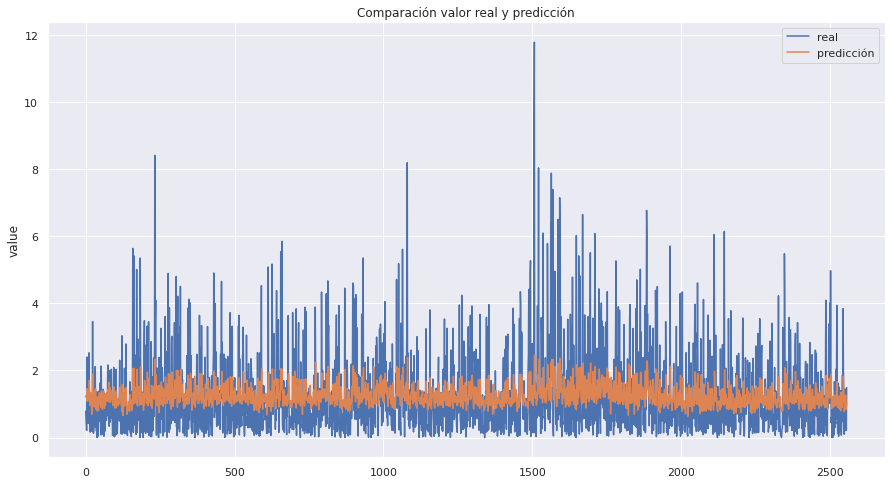

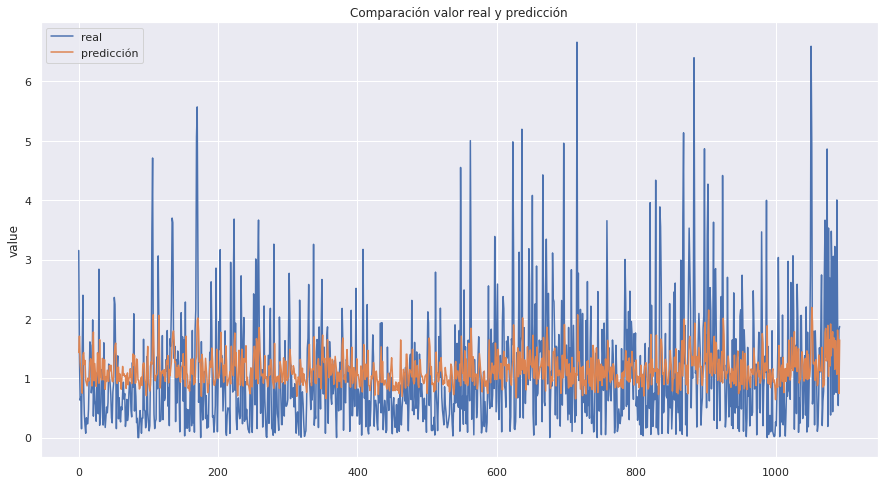

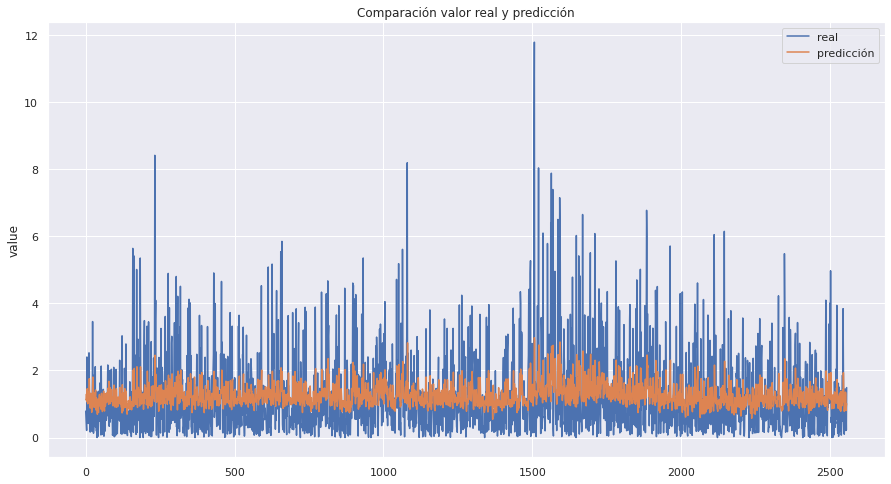

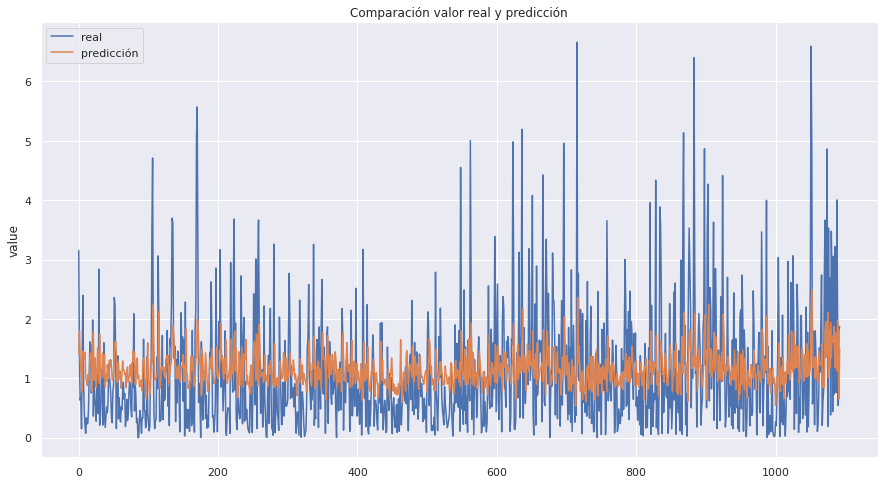

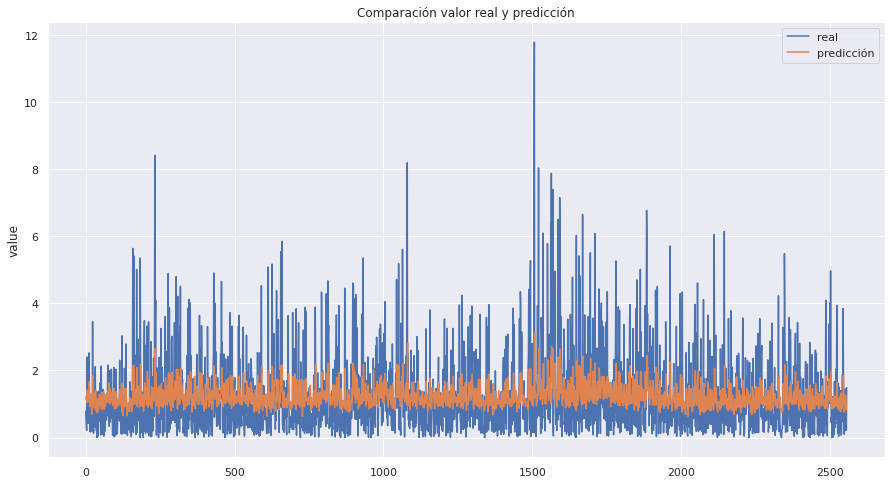

...

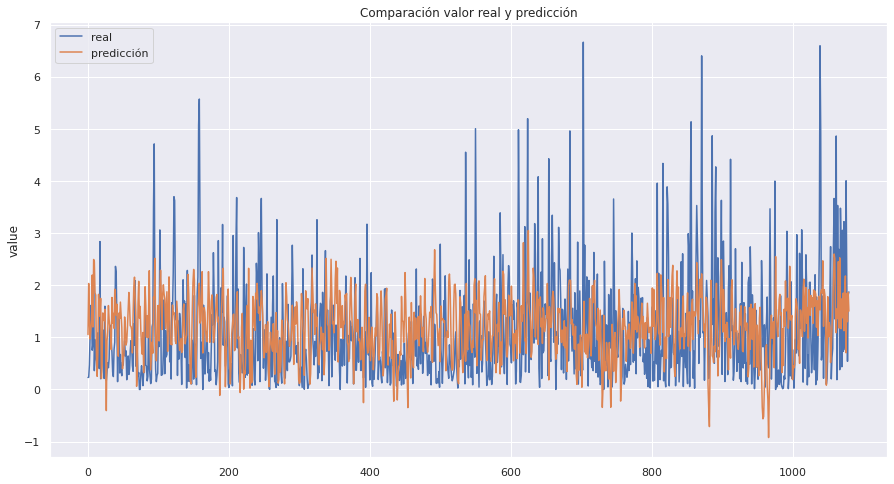

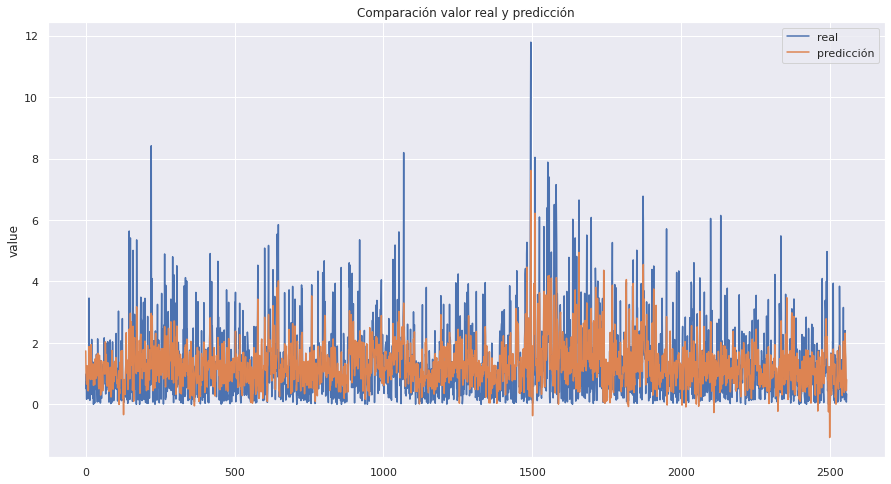

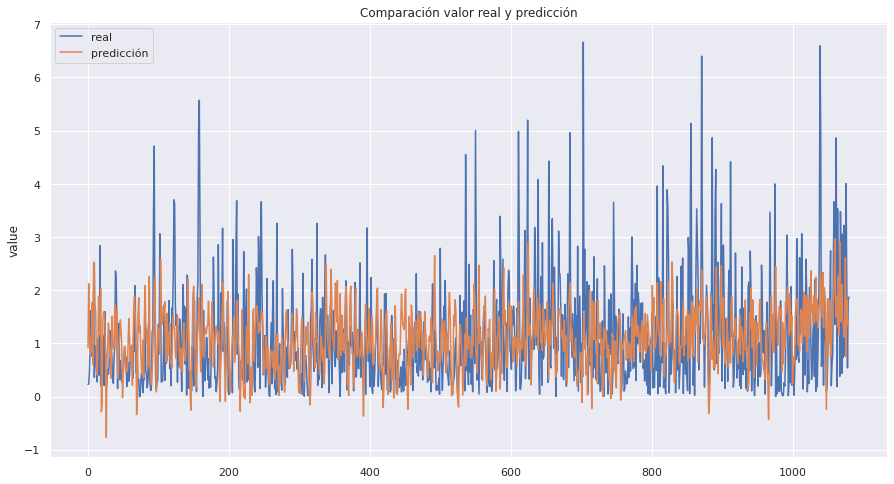

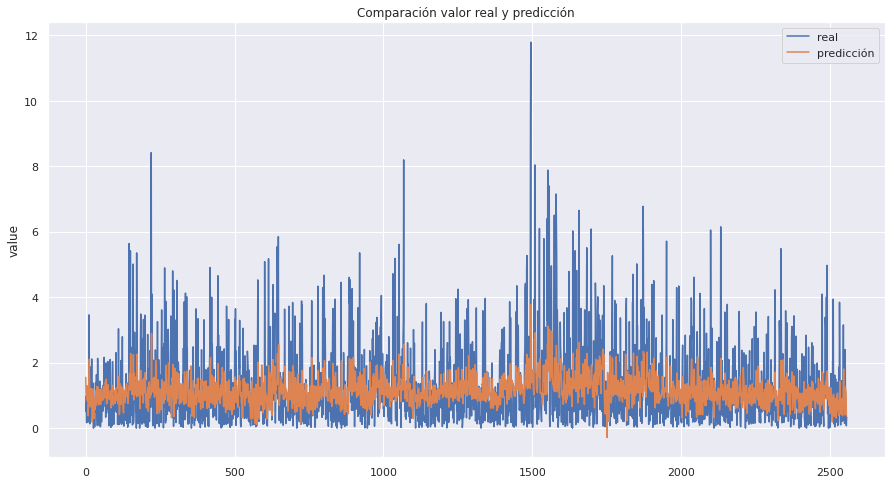

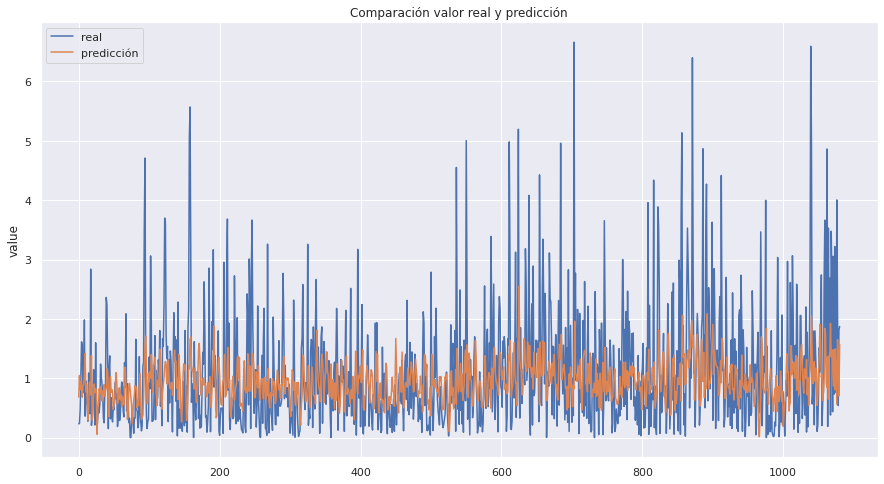

In [22]:
lags=[3,5,7,8,10,15]
n_estimators=[i for i in range(10,100,10)]
n_estimators.extend([200,300,500,2000])
results_models={i:{} for i in lags}
for lg in lags:
    for est in n_estimators:
        results_models[lg][est]=Model(df_data.copy(),df_label.copy(),lg,est)